<a href="https://colab.research.google.com/github/pgrebolt/SBI-tutorial/blob/main/SBI_tutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction to Simulation-based inference (SBI)

In [ ]:
!pip install tensorboard==2.11.0
!pip install sbi==0.21.0
!pip install corner


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 60.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.1/162.1 kB 14.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 93.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.3/781.3 kB 46.6 MB/s eta 0:00:00
  Attempting uninstall: tensorboard-data-server
    Found existing installation: tensorboard-data-server 0.7.2
    Uninstalling tensorboard-data-server-0.7.2:
      Successfully uninstalled tensorboard-data-server-0.7.2
  Attempting uninstall: protobuf
    Found existing installation: protobuf 4.25.5
    Uninstalling protobuf-4.25.5:
      Successfully uninstalled protobuf-4.25.5
  Attempting uninstall: google-auth-oauthlib
    Found existing installation: google-auth-oauthlib 1.2.1
    Uninstalling google-auth-oauthlib-1.2.1:
      Successfully uninstalled google-auth-oauthlib-1.2.1
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.17.1
    U

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.8/45.8 kB 1.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 269.3/269.3 kB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 21.5 MB/s eta 0:00:00
  Created wheel for nflows: filename=nflows-0.14-py3-none-any.whl size=53654 sha256=d9052db008008668c4fe6ba38803dc7d9c8d8901fd0bef1cf7abc8433655d501
  Stored in directory: /root/.cache/pip/wheels/11/9d/b5/5c88631a7bdb388738d147b6a28ba435ab969f25eff552f75a
Successfully built nflows


In [ ]:
import torch
#from sbi.analysis.sbc import run_sbc

from sbi.inference import SNPE, prepare_for_sbi, simulate_for_sbi
from sbi.utils.get_nn_models import posterior_nn
from sbi import utils as utils
from sbi import analysis as analysis
import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np
from sbi.inference import SNPE
from sbi.utils import get_density_thresholder, RestrictedPrior
from sbi.analysis import tensorboard_output as tbo
import corner
from sbi.utils import BoxUniform
from sbi.utils.user_input_checks import (
    check_sbi_inputs,
    process_prior,
    process_simulator,
)
from sbi.analysis import run_sbc, sbc_rank_plot


_ = torch.manual_seed(0)

In traditional Bayesian inference, when performing parameter estimation, we aim to compute the posterior distribution $p(\theta | x)$ using **Bayes' Theorem**:

$p(\theta | x) = \frac{p(x | \theta) p(\theta)}{p(x)}$

- $p(\theta)$: The prior distribution over the parameters, representing prior knowledge or beliefs about the parameters.
- $p(x | \theta)$: The likelihood, the probability of the observed data given a particular set of parameters.
- $p(x)$: The evidence, the probability of the observed data. It acts as a normalizing constant to ensure that the posterior integrates to 1.

In traditional approaches, people typically use either an explicit likelihood distribution or an approximation, then apply methods like **Markov Chain Monte Carlo (MCMC)** to sample from the unnormalized posterior distribution, i.e., $p(\theta | x) \propto p(x | \theta) p(\theta)$. Since sampling is often the goal, the normalization factor is unnecessary.

However, in fields like astrophysics, **complex simulators** often make the **likelihood intractable** or implicitly defined. Instead of relying on simplified, approximate likelihoods, likelihood-free inference or simulation-based inference can be used to directly leverage the simulator. In this sense, the simulator acts as a **stochastic generator** that, given parameters $\theta$, outputs a mock observation $x$. Due to the stochastic nature of the simulator, the output $x$ will vary across different runs, even for a fixed set of parameters $\theta$. Therefore, we can use the simulator to generate **samples from the likelihood** $p(x | \theta)$ when approximating the posterior distribution.


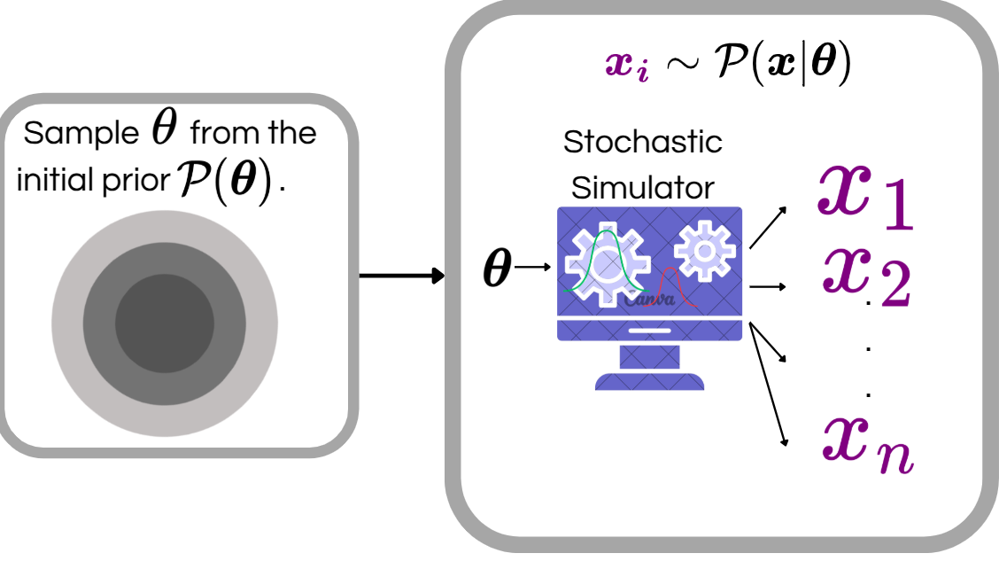


Three approaches are mainly used in simulation-based inference (SBI) when employing neural networks:

- **Neural Posterior Estimation (NPE):** The neural network directly approximates the map between the free parameters of the model, $\boldsymbol{\theta}$, and the posterior distribution, $p(\boldsymbol{\theta} | \boldsymbol{x})$ (e.g., Papamakarios et al. 2016, Lueckmann et al. 2017, Greenberg et al. 2019, Mishra-Sharma et al. 2022, Vasist et al. 2023, Dax et al. 2021, Barret et al. 2024).

- **Neural Likelihood Estimation (NLE):** A neural network is trained to emulate the simulator, i.e., used as a fast likelihood sample generator. Once the network has been trained, it can be used together with a sampling method, such as MCMC, to sample the posterior distribution (e.g., Papamakarios et al. 2018, Alsing et al. 2019).

- **Neural Ratio Estimation (NRE):** In this approach, a deep learning classifier learns the likelihood-to-evidence ratio, denoted by $r(\boldsymbol{\theta}, \boldsymbol{x}) \equiv p(\boldsymbol{x} |\boldsymbol{\theta}) / p(\boldsymbol{x})$, which is equivalent to $p(\boldsymbol{\theta} |\boldsymbol{x}) / p(\boldsymbol{\theta})$ using Bayes' theorem. To sample from the posterior distribution, one can then use MCMC or other sampling algorithms (e.g., Hermans et al. 2019, Miller et al. 2021, Bhardwaj et al. 2023, Saxena et al. 2024).



In this notebook, we will focus on **Neural Posterior Estimation (NPE)** and use the open-source package [sbi](https://github.com/sbi-dev/sbi).

The workflow is as follows:
- Sample the proposal prior distribution to obtain $\boldsymbol{\theta}_i \sim p(\boldsymbol{\theta})$.
- Using the simulator, generate synthetic data $\boldsymbol{x}_i \sim p(\boldsymbol{x} | \boldsymbol{\theta}_i)$ based on $\boldsymbol{\theta}_i$ from step 1.
- Train the neural density estimator on the dataset composed of pairs $(\boldsymbol{\theta}_i, \boldsymbol{x}_i)$ obtained in the previous steps.
- Use the trained neural density estimator to approximate the posterior distribution $p(\boldsymbol{\theta} | \boldsymbol{x}_0)$ at the observed data, $\boldsymbol{x}_0$.


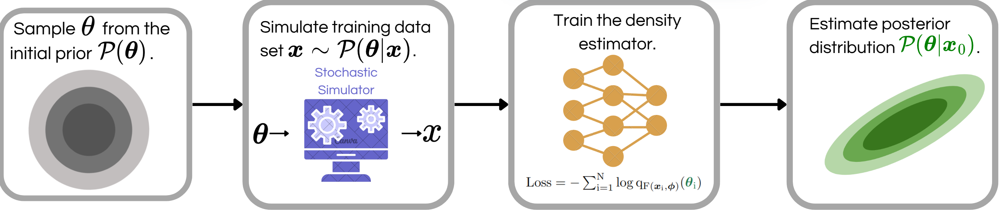

There are mainly two types of neural networks that are use as a density estimator: Normalizing flows and mixture density network.


A **mixture density network (MDN)** is a neural network that models a probability distribution as a weighted sum of multiple Gaussian components, where the network outputs the parameters of the mixture (means, variances, and weights).

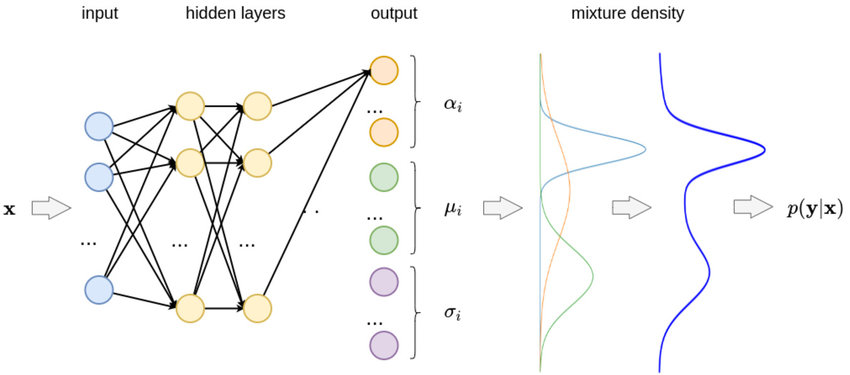

A **normalizing flow** is a method that transforms a simple base distribution (e.g., a Gaussian) into a more complex target distribution through a sequence of invertible transformations. These transformations are parameterized by a neural network and are designed to make the target distribution flexible while allowing efficient sampling and density evaluation.



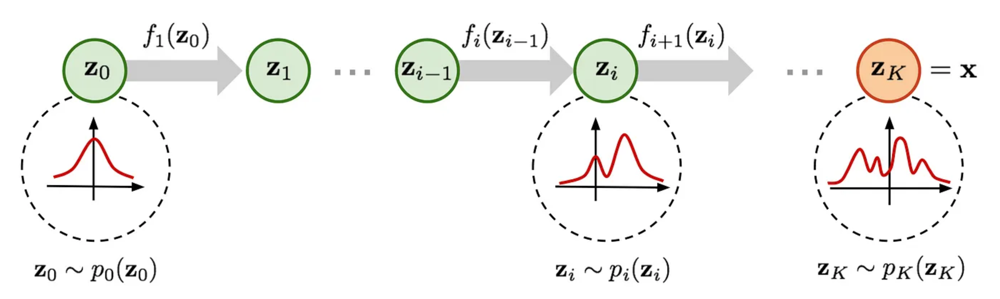

The network is optimized by minimizing the following loss function:

$\mathcal{L}(\boldsymbol{\phi}) = - \sum_{i=1}^N \log q_{F(x_i, \boldsymbol{\phi})} (\theta_i)$

### Simple Example of Inference

In this example, we define a simple model where the parameter vector $\boldsymbol{\theta} = (\theta_1, \theta_2, \theta_3)$ is modified as follows:

$$
y = \boldsymbol{\theta} + 1 + \mathcal{N}(0, 0.1)
$$


This added random number, taken from  $\mathcal{N}(0, 0.1)$, introduces the stochasticity into the simulator. Because of this, the output will vary across different runs of the simulator, even when the input $\boldsymbol{\theta}$ is fixed.


In [ ]:
num_dim = 3

def simulator(theta):
    # linear gaussian
    return theta + 1.0 + torch.randn_like(theta) * 0.1

prior = BoxUniform(low=-2 * torch.ones(num_dim), high=2 * torch.ones(num_dim))

Here, we are using this simple toy simulator. In practice, the simulator can be anything that takes parameters and returns simulated data. The data simulation process is decoupled from the algorithms implemented in the sbi package. That is, you can simulate your data beforehand, e.g., on a cluster or using a different programming language or environment. All that sbi needs is a Tensor of parameters theta and corresponding simulated data x. And, of course, observed data x_o.

However, sbi also offers a function to run your simulations in parallel. To that end, we have to ensure that your simulator and prior adhere to the requirements of sbi such as returning torch.Tensors in a standardised shape.

You can do so with the process_simulator() and process_prior() functions, which prepare them appropriately. Finally, you can call check_sbi_input() to make sure they are consistent which each other.

In [ ]:
# Check prior, return PyTorch prior.
prior, num_parameters, prior_returns_numpy = process_prior(prior)

# Check simulator, returns PyTorch simulator able to simulate batches.
simulator = process_simulator(simulator, prior, prior_returns_numpy)

# Consistency check after making ready for sbi.
check_sbi_inputs(simulator, prior)

Now, we instantiate the inference object using NPE.

In [ ]:
inference = SNPE(prior=prior)


Next, we need simulations, or more specifically, pairs of parameters $\boldsymbol{\theta}$ which we sample from the prior and corresponding simulations $x = \text{simulator}(\boldsymbol{\theta})$. The SBI helper function called `simulate_for_sbi` allows you to parallelize your code with joblib.


In [ ]:
num_simulations = 2000
theta = prior.sample((num_simulations,))
x = simulator(theta)
print("theta.shape", theta.shape)
print("x.shape", x.shape)

theta.shape torch.Size([2000, 3])
x.shape torch.Size([2000, 3])


In [ ]:
inference = inference.append_simulations(theta, x)


Next, we train the neural density estimator to learn the association between the simulated data (or data features) and the underlying parameters:

In [ ]:
density_estimator = inference.train(
                    learning_rate=5e-4,
                    training_batch_size=32,
                    validation_fraction=0.1,
                    show_train_summary=True,
                    retrain_from_scratch = True)

 Neural network successfully converged after 55 epochs.
        -------------------------
        ||||| ROUND 1 STATS |||||:
        -------------------------
        Epochs trained: 55
        Best validation performance: 2.5894
        -------------------------
        


In [ ]:
all_event_data = tbo._get_event_data_from_log_dir(
        inference._summary_writer.log_dir
    )

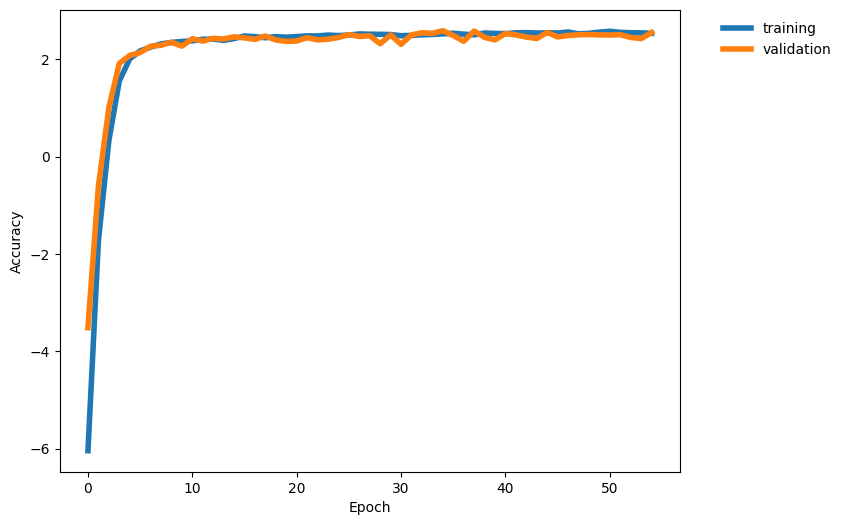

In [ ]:
training_statistics = all_event_data["scalars"]


# Save the plot showing the evolution of the training and validation losses.
f, ax = plt.subplots(figsize=(8, 6))
ax.set_xlabel(r"Epoch")
ax.set_ylabel(r"Accuracy")
ax.plot(
    training_statistics["training_log_probs"]["step"],
    training_statistics["training_log_probs"]["value"],
    linestyle="-",
    linewidth=4,
    color="tab:blue",
    rasterized=True,
    label="training",
)
ax.plot(
    training_statistics["validation_log_probs"]["step"],
    training_statistics["validation_log_probs"]["value"],
    linestyle="-",
    linewidth=4,
    color="tab:orange",
    rasterized=True,
    label="validation",
)
plt.legend(bbox_to_anchor=(1.05, 1), frameon=False, loc=0, fontsize=10)

Finally, we use this density estimator to build the posterior distribution $p(\boldsymbol{\theta} | x)$, i.e., the distributions over parameters $\boldsymbol{\theta}$ given observation $x$.

The posterior can then be used to (among other features which go beyond the scope of this introductory tutorial) sample parameters $\boldsymbol{\theta}$ from the posterior via `.sample()`, i.e., parameters that are likely given the observation $x$.

We can also get log-probabilities under the posterior via `.log_prob()`, i.e., we can evaluate the likelihood of parameters $\boldsymbol{\theta}$ given the observation $x$.


In [ ]:
posterior = inference.build_posterior(density_estimator)

print(posterior) # prints how the posterior was trained

Posterior conditional density p(θ|x) of type DirectPosterior. It samples the posterior network and rejects samples that
            lie outside of the prior bounds.


Let’s say we have made some observation $\boldsymbol{x}_{\text{obs}}$ for which we now want to infer the posterior:

**Note:** this is where your experimental observation would come in. For real observations, of course, you would not have access to the ground truth $\boldsymbol{\theta}$.


In [ ]:
theta_true = prior.sample((1,))
# generate our observation
x_obs = simulator(theta_true)

In [ ]:
x_obs

tensor([[ 0.8570,  2.7240, -0.5907]])

In [ ]:
theta_true

tensor([[-0.3777,  1.7730, -1.7444]])

Given this observation, we can sample from the posterior $p(\boldsymbol{\theta} | \boldsymbol{x}_{\text{obs}})$ and visualize the posterior.


In [ ]:
# Assuming 'posterior' is already defined and x_obs is the observation

# Sample 10000 samples from the posterior
samples = posterior.sample((10000,), x=x_obs)  # This should give a shape of (10000, 3)

# Ensure that samples is a NumPy array
samples_np = samples.detach().cpu().numpy()  # Convert PyTorch tensor to NumPy array


Drawing 10000 posterior samples:   0%|          | 0/10000 [00:00<?, ?it/s]

In [ ]:
samples_np.shape

(10000, 3)

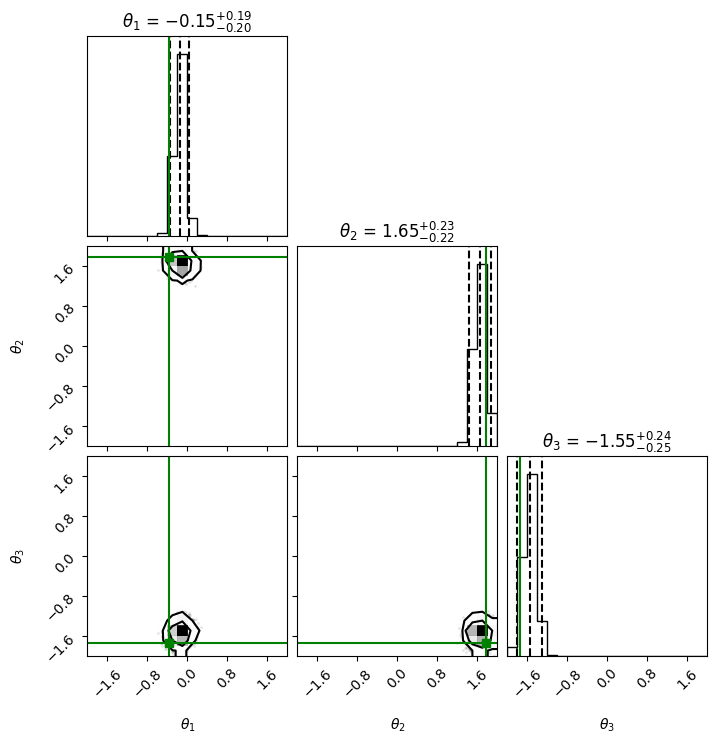

In [ ]:

# Create the figure using corner
fig = corner.corner(
    samples_np,
    labels=[r"$\theta_1$", r"$\theta_2$", r"$\theta_3$"],
    truths=theta_true[0],
    range=[[-2, 2], [-2, 2], [-2, 2]],
    color="k",
    quantiles=[0.025, 0.5, 0.975],
    levels=(
            1 - np.exp(-0.5),
            1 - np.exp(-2),
            1 - np.exp(-9.0 / 2.0),
        ),  # 1, 2 and 3 sigma levels
    show_titles=True,
    truth_color="g",
)


# Inferring parameters from images

In the example that follows, we consider a simple setup where the data points generated by the simulator model are high-dimensional (32x32 grayscale images) and we use a convolutional neural network as summary statistics extractor.


First of all, we import all the packages required for running the tutorial.

The simulator model that we consider has two parameters: $r$ and $\theta$.
It generates 100 two-dimensional points centered around $(r \cos\theta,r \sin\theta)$ and perturbed by a Gaussian noise with variance 0.01. Instead of simply outputting the $(x,y)$ coordinates of each data point, the model generates a grayscale image of the scattered points with dimensions 32 by 32. This image is further perturbed by an uniform noise with values betweeen 0 and 0.2. The code below defines such model.

In [ ]:
def simulator_model(parameter, return_points=False):
    """
    Simulator model with two-dimensional input parameter and 1024-D output

    This simulator serves as a basic example for using a neural net for learning summary features.
    It has only two input parameters but generates high-dimensional output vectors.
    The data is generated as follows:
        (-) Input:  parameter = [r, phi]
        (1) Generate 100 two-dimensional points centered around (r cos(phi),r sin(phi)) and perturbed by a Gaussian noise with variance 0.01
        (2) Create a grayscale image I of the scattered points with dimensions 32 by 32
        (3) Perturb I with an uniform noise with values betweeen 0 and 0.2
        (-) Output: I

    Args:
      parameter: array-like with shape (2) The two input parameters of the model, ordered as [r, phi]
      return_points: bool (default: False) Whether the simulator should return the coordinates of the simulated data points as well

    Returns:
      I: torch tensor, shape (1, 1024) Output flattened image
      (optional) points: array-like, shape (100, 2) Coordinates of the 2D simulated data points
    """
    r = parameter[0]
    phi = parameter[1]

    sigma_points = 0.10
    npoints = 100
    points = []
    for _ in range(npoints):
        x = r * torch.cos(phi) + sigma_points * torch.randn(1)
        y = r * torch.sin(phi) + sigma_points * torch.randn(1)
        points.append([x, y])
    points = torch.as_tensor(points)

    nx = 32
    ny = 32
    sigma_image = 0.20
    im = torch.zeros(nx, ny)
    for point in points:
        pi = int((point[0] - (-1)) / ((+1) - (-1)) * nx)
        pj = int((point[1] - (-1)) / ((+1) - (-1)) * ny)
        if (pi < nx) and (pj < ny):
            im[pi, pj] = 1
    im = im + sigma_image * torch.rand(nx, ny)
    im = im.T
    im = im.reshape(1, -1)

    if return_points:
        return im, points
    else:
        return im

The figure below shows an example of the output of the simulator when $r=0.70$ and $\theta=\pi/4$.

Text(0.5, 1.0, 'noisy observed data (gray image with 32 x 32 pixels)')

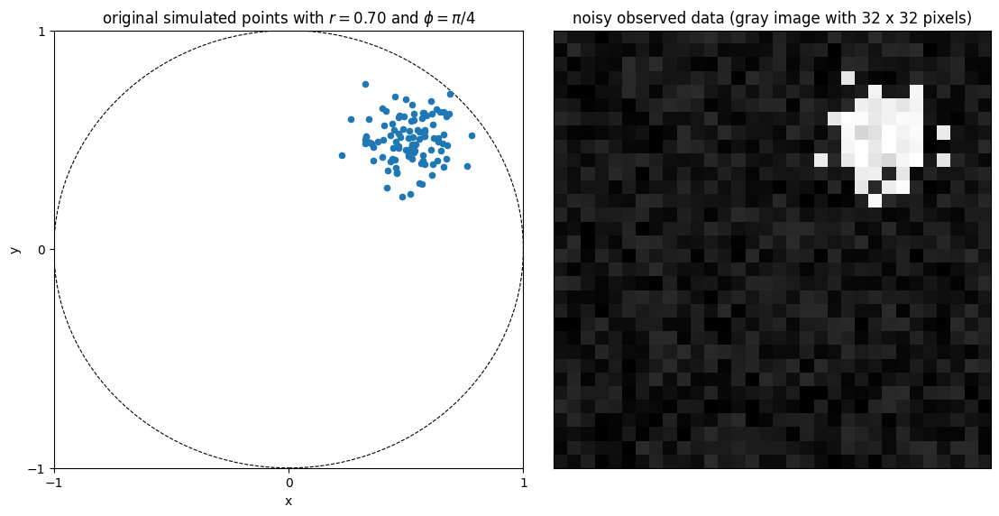

In [ ]:
# simulate samples
true_parameter = torch.tensor([0.70, torch.pi / 4])
x_observed, x_points = simulator_model(true_parameter, return_points=True)

# plot the observation
fig, ax = plt.subplots(
    facecolor="white", figsize=(11.15, 5.61), ncols=2, constrained_layout=True
)
circle = plt.Circle((0, 0), 1.0, color="k", ls="--", lw=0.8, fill=False)
ax[0].add_artist(circle)
ax[0].scatter(x_points[:, 0], x_points[:, 1], s=20)
ax[0].set_xlabel("x")
ax[0].set_ylabel("y")
ax[0].set_xlim(-1, +1)
ax[0].set_xticks([-1, 0.0, +1.0])
ax[0].set_ylim(-1, +1)
ax[0].set_yticks([-1, 0.0, +1.0])
ax[0].set_title(r"original simulated points with $r = 0.70$ and $\phi = \pi/4$")
ax[1].imshow(x_observed.view(32, 32), origin="lower", cmap="gray")
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_title("noisy observed data (gray image with 32 x 32 pixels)")

The outputs $x$ from the simulator are defined in a 1024 dimensional space (32 x 32 = 1024). To avoid having to setup a conditional neural density estimator to work directly on such high-dimensional vectors, one could use an embedding_net that would take the images as input and encode them into smaller vectors.

sbi provides pre-configured embedding networks of the following types:

- Fully-connected multi-layer perceptron
- Convolutional neural network (1D and 2D convolutions)
- Permutation-invariant neural network (for trial-based data)

In the example considered here, the most appropriate embedding_net would be a CNN for two-dimensional images. We can setup it using the predefined one from sbi or by defining a custom one. Here we use the predefined one:

In [ ]:
from sbi.neural_nets.embedding_nets import CNNEmbedding

embedding_net = CNNEmbedding(
    input_shape=(32, 32),
    in_channels=1,
    out_channels_per_layer=[6],
    num_conv_layers=1,
    num_linear_layers=1,
    output_dim=8,
    kernel_size=5,
    pool_kernel_size=8
)

With the embedding_net defined and instantiated, we can follow the usual workflow of an inference procedure in sbi. The embedding_net object appears as an input argument when instantiating the neural density estimator with sbi.

In [ ]:
# set prior distribution for the parameters
prior = utils.BoxUniform(
    low=torch.tensor([0.0, 0.0]), high=torch.tensor([1.0, 2 * torch.pi])
)

# make a SBI-wrapper on the simulator object for compatibility
prior, num_parameters, prior_returns_numpy = process_prior(prior)
simulator_wrapper = process_simulator(simulator_model, prior, prior_returns_numpy)
check_sbi_inputs(simulator_wrapper, prior)

In [ ]:
from sbi.utils.get_nn_models import posterior_nn

# instantiate the neural density estimator
neural_posterior = posterior_nn(model="mdn", embedding_net=embedding_net)

# setup the inference procedure with NPE
inferer = SNPE(prior=prior, density_estimator=neural_posterior)


In [ ]:
# run the inference procedure on one round and 10000 simulated data points
theta, x = simulate_for_sbi(simulator_wrapper, prior, num_simulations=10_000)

Running 10000 simulations.:   0%|          | 0/10000 [00:00<?, ?it/s]

We now generate 50000 samples of the posterior distribution of r and θ when observing an input data point x generated from the simulator model with $r=0.70$ and $\theta=\pi/4$.

In [ ]:
density_estimator = inferer.append_simulations(theta, x).train(training_batch_size=256, show_train_summary=True,)
posterior = inferer.build_posterior(density_estimator)

 Neural network successfully converged after 298 epochs.
        -------------------------
        ||||| ROUND 1 STATS |||||:
        -------------------------
        Epochs trained: 298
        Best validation performance: 3.3119
        -------------------------
        


In [ ]:
# generate posterior samples
true_parameter = torch.tensor([0.5, torch.pi / 3])
x_observed = simulator_model(true_parameter)
samples = posterior.set_default_x(x_observed).sample((50000,))

Drawing 50000 posterior samples:   0%|          | 0/50000 [00:00<?, ?it/s]

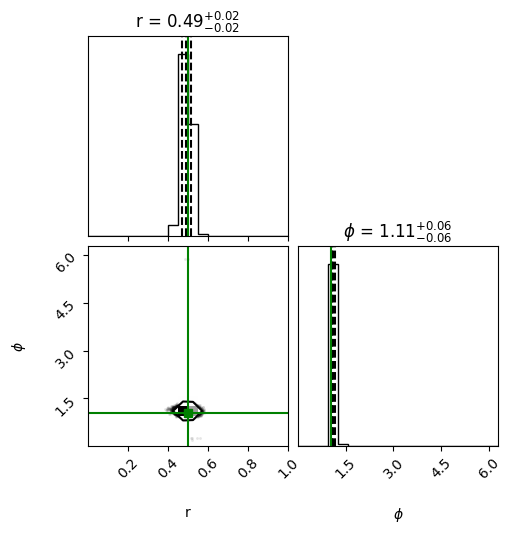

In [ ]:
# Ensure that samples is a NumPy array
samples_np = samples.detach().cpu().numpy()  # Convert PyTorch tensor to NumPy array

# Create the figure using corner
fig = corner.corner(
    samples_np,
    labels=["r", r"$\phi$"],
    truths=true_parameter,
    range=[[0, 1], [0, 2 * np.pi]],
    color="k",
    quantiles=[0.16, 0.5, 0.84],
    levels=(
            1 - np.exp(-0.5),
            1 - np.exp(-2),
            1 - np.exp(-9.0 / 2.0),
        ),  # 1, 2 and 3 sigma levels
    show_titles=True,
    figsize=(5, 5),
    truth_color="g",
)

# Simulation based calibration

Coverage probability measures how often the ground truth falls within the
estimated CI of the posterior distribution for a set of test samples. For example, a $95\%$ CI with a $99\%$ coverage probability means that, for $99\%$ of the test samples, the ground truth lies within the $95\%$ CI of the approximated posterior distribution. Therefore, the coverage can be used as a metric to assess the quality of the approximated posterior distribution in our test dataset.\\
For a well-calibrated approximated posterior distribution, the coverage probability will match the intended credibility level, resulting in a diagonal line when plotted. A conservative model, however, will have a higher coverage probability and produce wider approximated posterior distributions that contain the true parameter more frequently, thus lying above the diagonal. A conservative estimate, hence, reduces the risk of excluding the ground truth values. In contrast, an overconfident model has a lower coverage probability, resulting in approximated posterior distributions that are too narrow and often miss the ground truth value, placing its coverage probability below the diagonal.

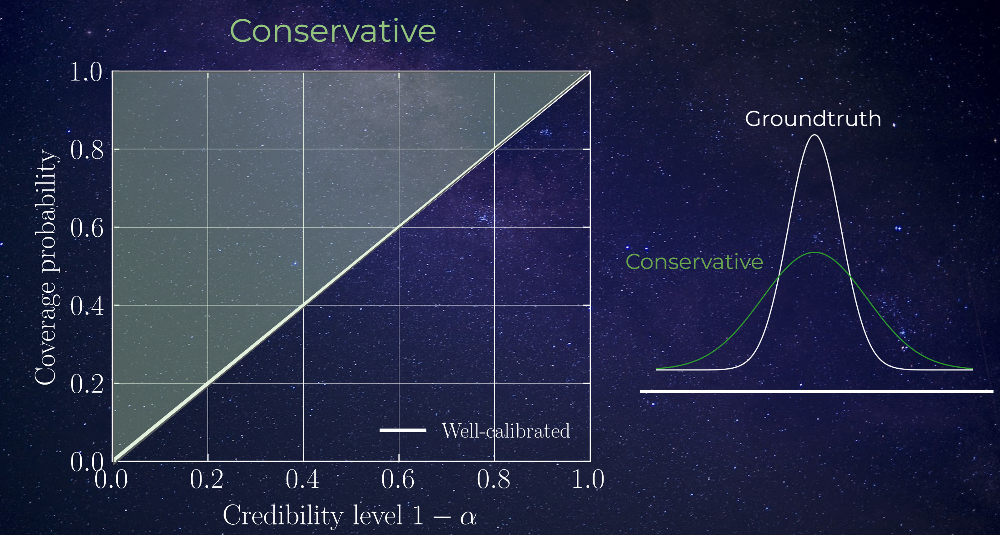

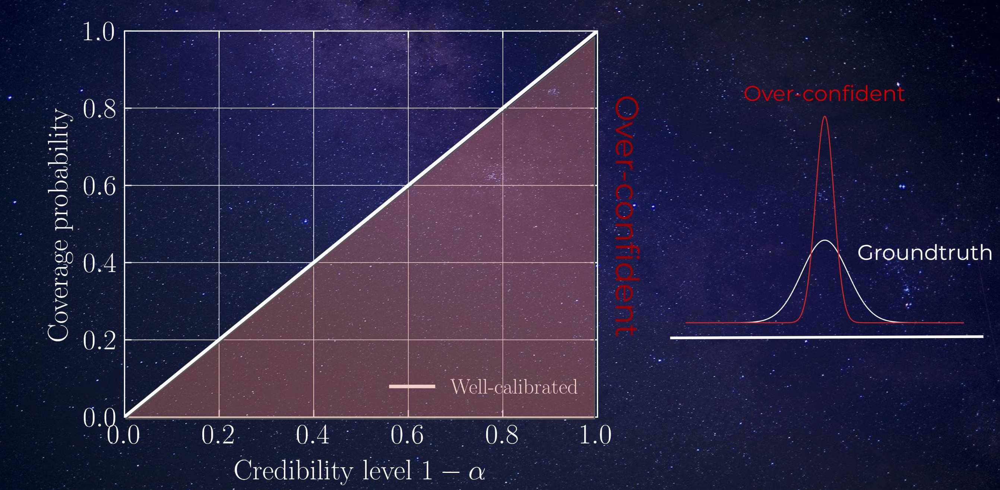

In [ ]:
def coverage_probability(posterior, theta, x, n_samples_coverage, device='cpu'):

    hdr = []

    for index in tqdm(range(theta.size(0)), desc="Computing Coverage Probability"):
        simulation_output = x[index]
        true_value = theta[index]

        posterior_samples = posterior.set_default_x(simulation_output).sample((n_samples_coverage,), show_progress_bars=False)

        # Evaluating the PDF value of the ground truth.
        log_p_true = (
            posterior.log_prob(true_value.to(device), simulation_output.to(device)))
        # Evaluating the PDF values of the posterior samples.
        log_p_samples = posterior.log_prob(posterior_samples.to(device), simulation_output.to(device))

        # Determining the fraction of PDF values that are larger than that of the ground truth.
        hdr.append((log_p_samples > log_p_true).float().mean())

    return hdr


In [ ]:
theta_test, x_test = simulate_for_sbi(simulator_wrapper, prior, num_simulations=1000)

Running 1000 simulations.:   0%|          | 0/1000 [00:00<?, ?it/s]

In [ ]:
def plot_coverage(hdr_testset):
    betas = np.linspace(0, 1, 12)
    coverage_probability = np.zeros(len(betas))
    hdr_testset_sorted = np.sort(np.asarray(hdr_testset))

    # For each value of beta, we calculate the percentage of test samples for which the
    # highest density region (HDR), in hdr_testset, is lower than beta. Then, among these test samples, each of the
    # true values will fall inside this beta's HDR.

    for i,beta in enumerate(betas):
        coverage_probability[i] = (hdr_testset_sorted < beta).mean()

    # Plot the coverage.
    plt.plot(
        betas,
        coverage_probability,
        color="steelblue",
        label="upper right",
    )
    plt.plot([0, 1], [0, 1], color="k", linestyle="--")
    plt.xlim(0, 1)
    plt.ylim(0, 1)

    plt.xlabel(r"Credibility level $1-\alpha$", fontsize=10)
    plt.ylabel(r"Coverage probability", fontsize=10)
    plt.show()

In [ ]:
coverage = coverage_probability(posterior,theta_test, x_test, 5000, device = 'cpu')


Computing Coverage Probability: 100%|██████████| 1000/1000 [06:57<00:00,  2.40it/s]


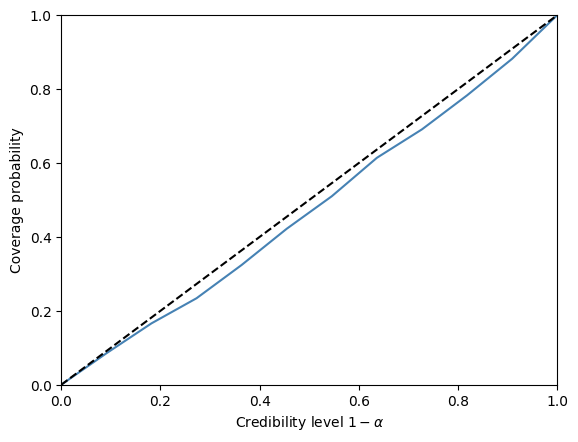

In [ ]:
plot_coverage(coverage)

In [ ]:
ranks, dap_samples = run_sbc(theta_test, x_test, posterior, num_posterior_samples=1_000, reduce_fns=posterior.log_prob)

Running 1000 sbc samples.:   0%|          | 0/1000 [00:00<?, ?it/s]

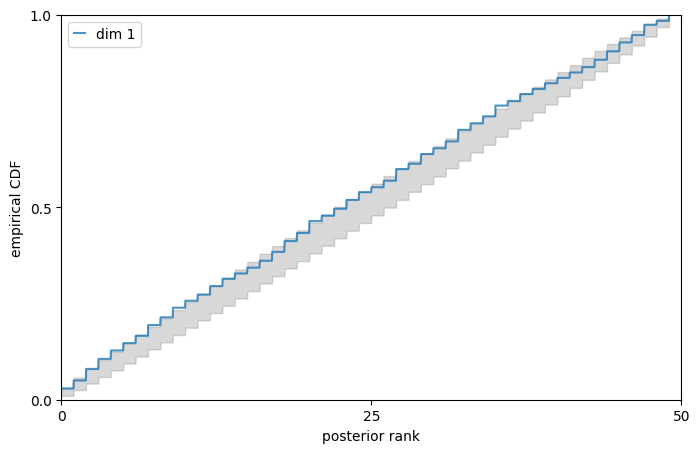

In [ ]:
_ = sbc_rank_plot(ranks=ranks,num_posterior_samples=1000,plot_type="cdf",num_bins=None,)